# Student name: Doan Ngoc Mai
# ID: 21127104

# 1. Preparing the data sets

In [42]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from sklearn import datasets
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report, confusion_matrix

In [43]:
datasets=pd.read_csv("poker-hand-data.csv")
datasets

,Suit of card #1,Rank of card #1,Suit of card #2,Rank of card #2,Suit of card #3,Rank of card #3,Suit of card #4,Rank of card #4,Suit of card #5,Rank of card #5,Poker Hand
0,1,10,1,11,1,13,1,12,1,1,9
1,2,11,2,13,2,10,2,12,2,1,9
2,3,12,3,11,3,13,3,10,3,1,9
3,4,10,4,11,4,1,4,13,4,12,9
4,4,1,4,13,4,12,4,11,4,10,9
...,...,...,...,...,...,...,...,...,...,...,...
1025005,3,1,1,12,2,9,4,9,2,6,1
1025006,3,3,4,5,2,7,1,4,4,3,1
1025007,1,11,4,7,3,9,1,13,2,7,1
1025008,3,11,1,8,1,1,3,13,2,8,1


In [259]:
X = datasets.iloc[:,:-1].values
y = datasets.iloc[:,-1].values 

from sklearn.model_selection import train_test_split

# Split the data into four subsets of training and testing data, using different test sizes (40%, 60%, 80%, and 90%)
# Stratify the splits so that the class distribution is approximately the same in the training and testing data
# Use a fixed random seed (42) for reproducibility
X_train_40, X_test_40, y_train_40, y_test_40 = train_test_split(X, y, test_size=0.6, stratify=y, random_state=42)
X_train_60, X_test_60, y_train_60, y_test_60 = train_test_split(X, y, test_size=0.4, stratify=y, random_state=42)
X_train_80, X_test_80, y_train_80, y_test_80 = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)
X_train_90, X_test_90, y_train_90, y_test_90 = train_test_split(X, y, test_size=0.1, stratify=y, random_state=42)

# 1.1. Visualize the distributions of classes in all the data sets. 

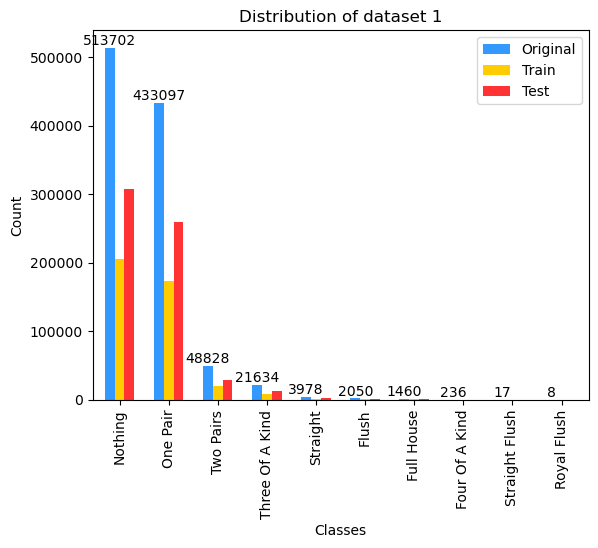

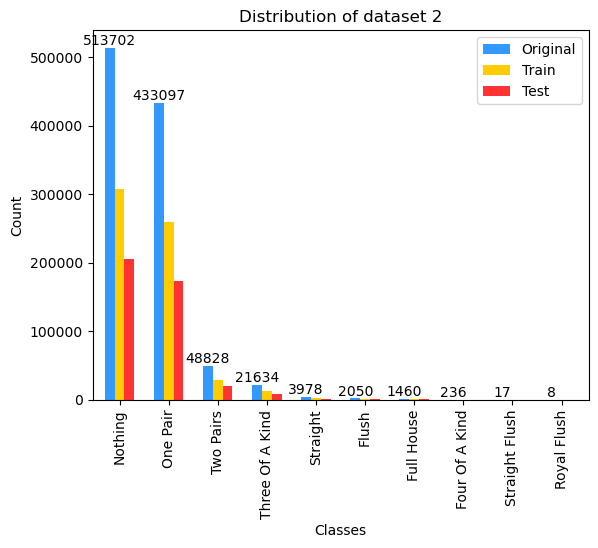

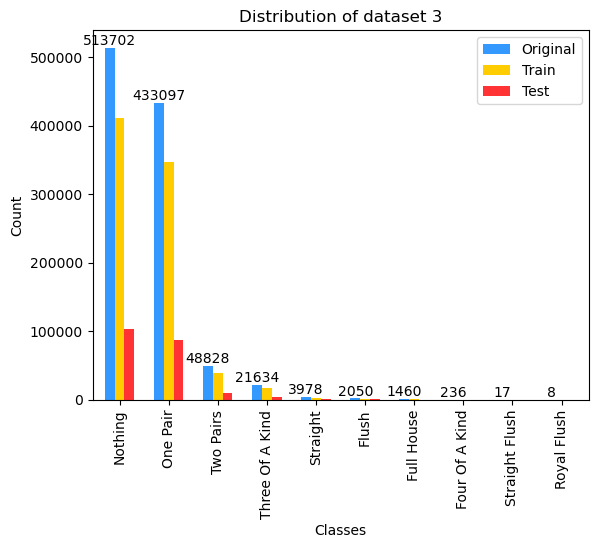

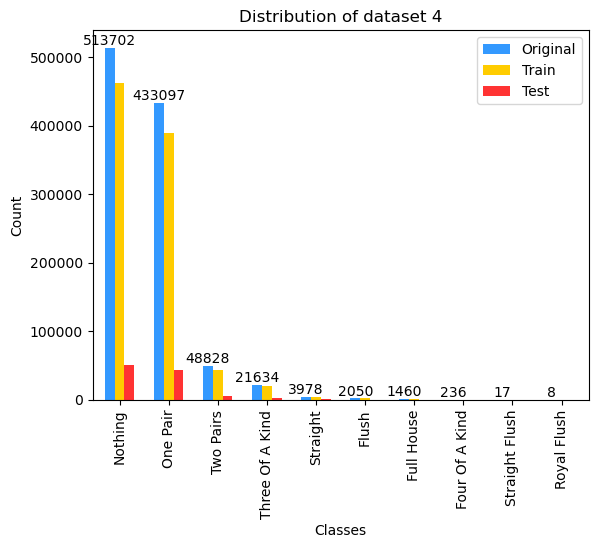

In [260]:
import matplotlib.pyplot as plt

feature_names = ["S", "C1", "S2", "C2", "S3", "C3", "S4", "C4", "S5", "C5"] 
class_names= ["Nothing", "One Pair", "Two Pairs", "Three Of A Kind", "Straight", "Flush", "Full House", "Four Of A Kind", "Straight Flush", "Royal Flush"]

def draw_distribute_plot(original, train, test, title):
    
    #Counts the occurrences of each class and sorts in ascending order.
    count_original = pd.Series(original).value_counts().sort_index()
    count_train = pd.Series(train).value_counts().sort_index()
    count_test = pd.Series(test).value_counts().sort_index()
    
    #Concatenate the counts into a single dataframe
    df = pd.concat([count_original, count_train, count_test], axis=1, keys=['Original', 'Train', 'Test']).fillna(0)
    df.index = class_names

    ax = df.plot(kind='bar', xlabel="Classes", ylabel="Count", title=title, color=['#3399FF','#FFCC00','#FF3333'], width=0.6)
    ax.set_xticklabels(class_names, rotation=90)
    ax.bar_label(ax.containers[0])
    #ax.bar_label(ax.containers[1])
    #ax.bar_label(ax.containers[2])
    plt.show()

subsets = [(X_train_40, X_test_40, y_train_40, y_test_40),
           (X_train_60, X_test_60, y_train_60, y_test_60),
           (X_train_80, X_test_80, y_train_80, y_test_80),
           (X_train_90, X_test_90, y_train_90, y_test_90)]

for i, subset in enumerate(subsets):
    X_train, X_test, y_train, y_test = subset
    draw_distribute_plot(y, y_train, y_test, f"Distribution of dataset {i+1}")
    #dataset 1, 2, 3, 4 are respectively distribution of 40/60, 60/40, 80/20, and 90/10 


# 2. Building the decision tree classifiers

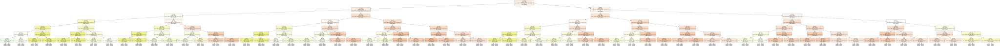

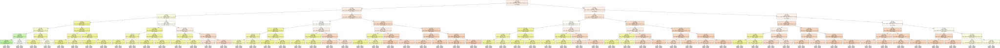

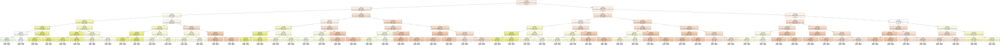

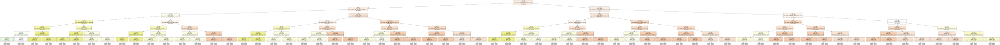

In [231]:
from sklearn.tree import DecisionTreeClassifier, export_graphviz
import graphviz 

decision_trees = []

# Iterate over the subsets and train a decision tree classifier for each one
for i, subset in enumerate(subsets):
    feature_train, feature_test, label_train, label_test = subset
    
    decision_tree = DecisionTreeClassifier(criterion='gini', random_state=0, max_depth=None)
    decision_tree.fit(feature_train, label_train.ravel())
    decision_trees.append(decision_tree)
    
    # Visualize the decision tree
    dot_data = export_graphviz(decision_tree, out_file=None,feature_names=feature_names, class_names=class_names, filled=True,special_characters=True,
    max_depth=6) #choosing randomly max_depth value
    
    graph = graphviz.Source(dot_data)
    graph.render(f'decision_tree_{i}')
    display(graph)


# 3. Evaluating the decision tree classifiers


In [47]:
from sklearn.metrics import classification_report, confusion_matrix

#summarizes the precision, recall, f1-score, and support for each class in the predicted labels
for i, subset in enumerate(subsets):
    X_train, X_test, y_train, y_test = subset
    clf = decision_trees[i]
    y_pred = clf.predict(X_test)
    print(f"Classification report for dataset {i+1}:")
    print(classification_report(y_test, y_pred, target_names=class_names, zero_division=0))

Classification report for dataset 1:
                 precision    recall  f1-score   support

        Nothing       0.70      0.69      0.70    308221
       One Pair       0.57      0.57      0.57    259858
      Two Pairs       0.24      0.27      0.25     29297
Three Of A Kind       0.25      0.28      0.27     12980
       Straight       0.19      0.21      0.20      2387
          Flush       0.06      0.09      0.07      1230
     Full House       0.08      0.09      0.08       876
 Four Of A Kind       0.09      0.11      0.10       142
 Straight Flush       0.00      0.00      0.00        10
    Royal Flush       0.00      0.00      0.00         5

       accuracy                           0.61    615006
      macro avg       0.22      0.23      0.22    615006
   weighted avg       0.61      0.61      0.61    615006

Classification report for dataset 2:
                 precision    recall  f1-score   support

        Nothing       0.73      0.71      0.72    205481
       One

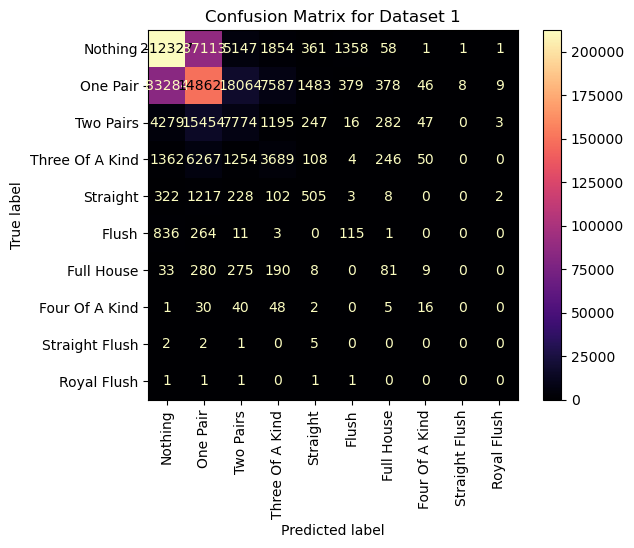

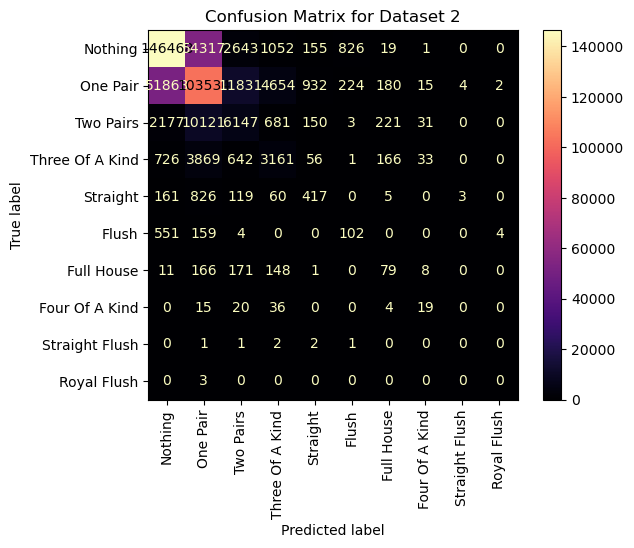

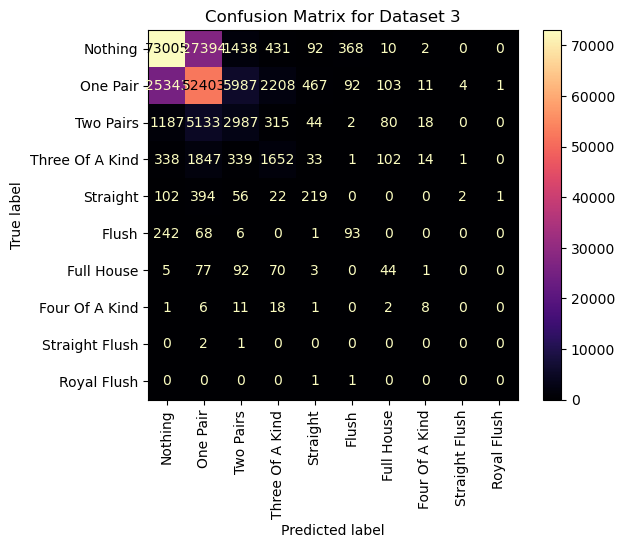

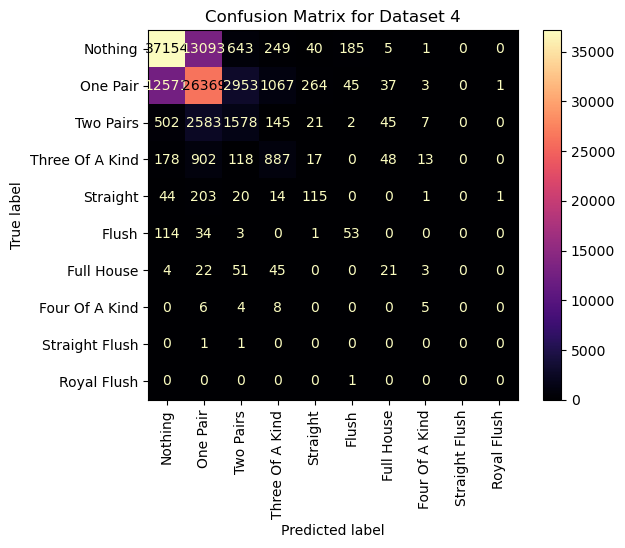

In [262]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

#get the test data and use the corresponding decision tree model to make predictions on that test data
for i, subset in enumerate(subsets):
    X_train, X_test, y_train, y_test = subset
    clf = decision_trees[i]
    y_pred = clf.predict(X_test)
    cm = confusion_matrix(y_test, y_pred)
    
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
    disp.plot(cmap='magma', xticks_rotation=90, values_format='d') #plot the confusion matrix
    
    plt.title(f"Confusion Matrix for Dataset {i+1}")
    plt.show()

# 4. The depth and accuracy of a decision tree

In [204]:
from sklearn.metrics import accuracy_score

feature_train_80, feature_test_80, label_train_80, label_test_80 = subsets[2]

## 4.1 Max_depth = None

In [205]:
decisionTree_none = DecisionTreeClassifier(criterion='gini', random_state=0) #max_depth = default = None
decisionTree_none.fit(feature_train_80, label_train_80.ravel())

DecisionTreeClassifier(random_state=0)

### Decision tree 

In [256]:
dot_data_none = export_graphviz(decisionTree_none, out_file=None, feature_names=feature_names, class_names=class_names, filled=True, special_characters=True,
max_depth = 11)

graph = graphviz.Source(dot_data_none)
graph.render(f'decision_tree_none')
display(graph)

#graph.format = 'png'  # set the output format to PNG
#graph.render('decision_tree_none')  # save the tree as a PNG file
#display(graph)


(process:8052): GLib-GIO-WARNING **: 22:26:48.869: Unexpectedly, UWP app `Clipchamp.Clipchamp_2.5.15.0_neutral__yxz26nhyzhsrt' (AUMId `Clipchamp.Clipchamp_yxz26nhyzhsrt!App') supports 41 extensions but has no verbs

(process:8052): GLib-GIO-WARNING **: 22:26:48.965: Unexpectedly, UWP app `Microsoft.ScreenSketch_11.2303.17.0_x64__8wekyb3d8bbwe' (AUMId `Microsoft.ScreenSketch_8wekyb3d8bbwe!App') supports 29 extensions but has no verbs

(process:8052): GLib-GIO-WARNING **: 22:26:48.980: Unexpectedly, UWP app `6760NGPDFLab.PDFX_1.3.53.0_x64__sbe4t8mqwq93a' (AUMId `6760NGPDFLab.PDFX_sbe4t8mqwq93a!App') supports 32 extensions but has no verbs

(process:8052): GLib-GIO-WARNING **: 22:26:48.984: Unexpectedly, UWP app `Evernote.Evernote_10.56.9.0_x64__q4d96b2w5wcc2' (AUMId `Evernote.Evernote_q4d96b2w5wcc2!Evernote') supports 1 extensions but has no verbs

(process:8704): GLib-GIO-WARNING **: 22:27:16.638: Unexpectedly, UWP app `Clipchamp.Clipchamp_2.5.15.0_neutral__yxz26nhyzhsrt' (AUMId `Clipc

### Accuracy with max_depth = None

In [207]:
Predict_none = decisionTree_none.predict(feature_test_80)
accuracy_score(label_test_80, Predict_none)

0.6361450132193832

## 4.2 Max_depth = 2 

In [241]:
decisionTree_2 = DecisionTreeClassifier(criterion='gini', max_depth=2, random_state=0)
decisionTree_2.fit(feature_train_80, label_train_80.ravel())

DecisionTreeClassifier(max_depth=2, random_state=0)

### Decision tree

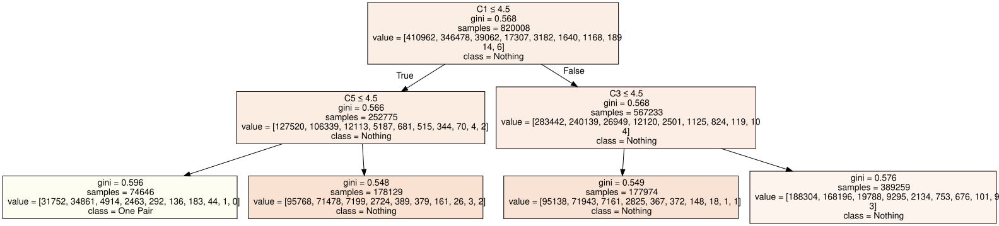

In [255]:
dot_data_2 = export_graphviz(decisionTree_2, out_file=None, feature_names=feature_names, class_names=class_names, filled=True, special_characters=True)
graph = graphviz.Source(dot_data_2)
graph.render(f'decision_tree_2')
display(graph)
#graph.format = 'png'  # set the output format to PNG
#graph.render('decision_tree_2')  # save the tree as a PNG file
#display(graph)

### Accuracy with max_depth = 2  

In [210]:
Predict_2 = decisionTree_2.predict(feature_test_80)
accuracy_score(label_test_80, Predict_2)

0.506151159500883

## 4.3 Max_depth = 3

In [211]:
decisionTree_3 = DecisionTreeClassifier(criterion='gini', max_depth=3, random_state=0)
decisionTree_3.fit(feature_train_80, label_train_80.ravel())

DecisionTreeClassifier(max_depth=3, random_state=0)

### Decision tree 

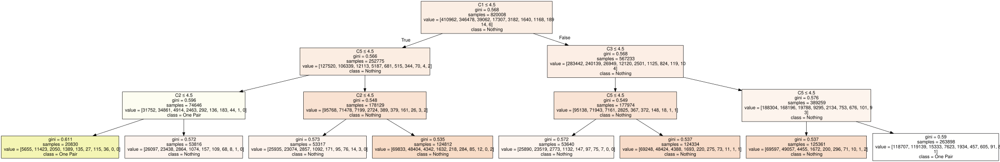

In [254]:
dot_data_3 = export_graphviz(decisionTree_3, out_file=None, feature_names=feature_names, class_names=class_names, filled=True, special_characters=True)
graph = graphviz.Source(dot_data_3)
graph.render(f'decision_tree_3')
display(graph)
#graph.format = 'png'  # set the output format to PNG
#graph.render('decision_tree_3')  # save the tree as a PNG file
#display(graph)

### Accuracy with max_depth = 3  

In [213]:
Predict_3 = decisionTree_3.predict(feature_test_80)
accuracy_score(label_test_80, Predict_3)

0.5085267460805261

## 4.4 Max_depth = 4 

In [243]:
decisionTree_4 = DecisionTreeClassifier(criterion='gini', max_depth=4, random_state=0)
decisionTree_4.fit(feature_train_80, label_train_80.ravel())

DecisionTreeClassifier(max_depth=4, random_state=0)

### Decision tree 

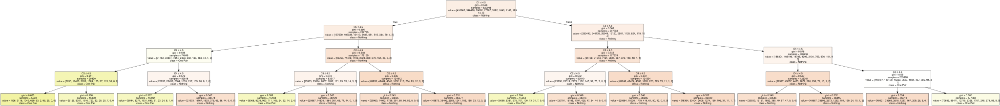

In [253]:
dot_data_4 = export_graphviz(decisionTree_4, out_file=None,feature_names=feature_names,class_names=class_names,filled=True,special_characters=True)
graph = graphviz.Source(dot_data_4)
graph.render(f'decision_tree_4')
display(graph)
#graph.format = 'png'  # set the output format to PNG
#graph.render('decision_tree_4')  # save the tree as a PNG file
#display(graph)

### Accuracy with max_depth = 4

In [216]:
Predict_4 = decisionTree_4.predict(feature_test_80)
accuracy_score(label_test_80, Predict_4)

0.5365947649291226

## 4.5 Max_depth = 5 

In [217]:
decisionTree_5 = DecisionTreeClassifier(criterion='gini', max_depth=5, random_state=0)
decisionTree_5.fit(feature_train_80, label_train_80.ravel())

DecisionTreeClassifier(max_depth=5, random_state=0)

### Decision tree 

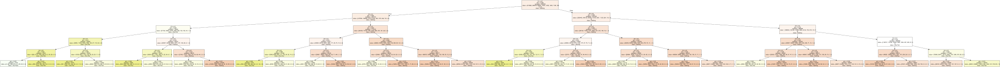

In [252]:
dot_data_5 = export_graphviz(decisionTree_5, out_file=None, feature_names=feature_names, class_names=class_names, filled=True, special_characters=True)
graph = graphviz.Source(dot_data_5)
graph.render(f'decision_tree_5')
display(graph)
#graph.format = 'png'  # set the output format to PNG
#graph.render('decision_tree_5')  # save the tree as a PNG file
#display(graph)

### Accuracy with max_depth = 5  

In [219]:
Predict_5 = decisionTree_5.predict(featureTest_80)
accuracy_score(label_test_80, Predict_5)

0.5539116691544472

## 4.6 Max_depth = 6 

In [220]:
decisionTree_6 = DecisionTreeClassifier(criterion='gini', max_depth=6, random_state=0)
decisionTree_6.fit(feature_train_80, label_train_80.ravel())

DecisionTreeClassifier(max_depth=6, random_state=0)

### Decision tree 

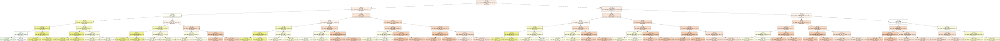

In [251]:
dot_data_6 = export_graphviz(decisionTree_6, out_file=None, feature_names=feature_names, class_names=class_names, filled=True,special_characters=True)
graph = graphviz.Source(dot_data_6)
graph.render(f'decision_tree_6')
display(graph)
#graph.format = 'png'  # set the output format to PNG
#graph.render('decision_tree_6')  # save the tree as a PNG file
#display(graph)

### Accuracy with max_depth = 6 

In [248]:
Predict_6 = decisionTree_6.predict(feature_test_80)
accuracy_score(label_test_80, Predict_6)

0.5538287431342134

## 4.7 Max_depth = 7

In [223]:
decisionTree_7 = DecisionTreeClassifier(criterion='gini', max_depth=7, random_state=0)
decisionTree_7.fit(feature_train_80, label_train_80.ravel())

DecisionTreeClassifier(max_depth=7, random_state=0)

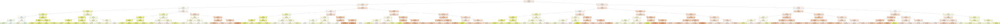

In [250]:
dot_data_7 = export_graphviz(decisionTree_7, out_file=None,feature_names=feature_names,class_names=class_names,filled=True,special_characters=True)
graph = graphviz.Source(dot_data_7)
graph.render(f'decision_tree_7')
display(graph)
#graph.format = 'png'  # set the output format to PNG
#graph.render('decision_tree_7')  # save the tree as a PNG file
#display(graph)

### Accuracy score with max_depth = 7 

In [257]:
Predict_7 = decisionTree_7.predict(feature_test_80)
accuracy_score(label_test_80, Predict_7)

0.5593116164720344